# Homography Transform Notebook

This notebook is part of the **Film Emulation** project.  
It implements and demonstrates homography-based geometric transformations, which are essential for aligning and comparing images taken from different perspectives or with different cameras.

## Purpose

- **Align images** (e.g., scanned film and digital reference) using feature matching and homography.
- **Visualize correspondences** and transformation results.
- **Prepare data** for further color and tone mapping steps in the film emulation workflow.

## Workflow Overview

According to the project roadmap, this notebook covers:

1. **Feature Detection & Matching:**  
   Detect keypoints and descriptors in both images using algorithms like ORB or SIFT.

2. **Homography Estimation:**  
   Compute the transformation matrix that maps points from one image to the other using RANSAC.

3. **Image Warping:**  
   Apply the homography to align the source image with the target.

4. **Visualization:**  
   Display matches and overlay results for verification.

5. **Export:**  
   Save aligned images for use in subsequent color and tone mapping notebooks.

---

**Inputs:**  
- Two images (e.g., digital and film scans) to be aligned.

**Outputs:**  
- Aligned images and visualizations of feature matches.

For more details, see the project

In [1]:
import numpy as np
from PIL import Image
from typing import Union, List

def preview_images(
    images: Union[np.ndarray, List[np.ndarray]],
    width: int = 600,
    convert_bgr_to_rgb: bool = False
) -> Image.Image:
    """
    Preview one or more np.ndarray images side-by-side.

    Parameters:
        images (Union[np.ndarray, List[np.ndarray]]): Single or list of RGB/BGR images.
        width (int): Resize width for each image (height scaled proportionally).
        convert_bgr_to_rgb (bool): Whether to convert BGR to RGB before display.

    Returns:
        PIL.Image.Image: Combined side-by-side preview image.
    """

    if isinstance(images, np.ndarray):
        images = [images]

    def resize_np_image(img_np, target_width):
        if convert_bgr_to_rgb:
            img_np = img_np[..., ::-1]  # BGR to RGB
        h, w = img_np.shape[:2]
        scale = target_width / w
        new_size = (target_width, int(h * scale))
        return Image.fromarray(img_np).resize(new_size)

    resized_images = [resize_np_image(img, width) for img in images]

    total_width = sum(img.width for img in resized_images)
    max_height = max(img.height for img in resized_images)

    combined = Image.new("RGB", (total_width, max_height))
    x_offset = 0
    for img in resized_images:
        combined.paste(img, (x_offset, 0))
        x_offset += img.width

    return combined


In [2]:
import cv2
import numpy as np
from typing import Tuple

import cv2
import numpy as np
from typing import Tuple

def align_images_by_features(img1_rgb: np.ndarray, img2_rgb: np.ndarray, scale: float = 0.5) -> Tuple[np.ndarray, np.ndarray]:
    """
    Align img2_rgb to img1_rgb using ORB feature detection and homography transformation.

    Parameters:
        img1_rgb (np.ndarray): Reference image in RGB format.
        img2_rgb (np.ndarray): Image to be aligned in RGB format.
        scale (float): Downscaling factor for faster computation (default 0.5).

    Returns:
        Tuple[np.ndarray, np.ndarray]: (img1_rgb, img2_aligned_rgb) aligned to the perspective of img1_rgb.
    """
    h, w = img1_rgb.shape[:2]

    # Resize images for faster feature detection
    img1_small = cv2.resize(img1_rgb, (int(w * scale), int(h * scale)))
    img2_small = cv2.resize(img2_rgb, (int(w * scale), int(h * scale)))

    # Convert to grayscale for feature detection
    gray1 = cv2.cvtColor(img1_small, cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor(img2_small, cv2.COLOR_RGB2GRAY)

    # ORB feature detector
    orb = cv2.ORB_create(nfeatures=5000)
    kp1, des1 = orb.detectAndCompute(gray1, None)
    kp2, des2 = orb.detectAndCompute(gray2, None)

    # Match features using Brute Force Hamming matcher
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    if len(matches) < 10:
        raise ValueError("Not enough matches found for alignment.")

    # Extract matched keypoints and rescale back
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2) / scale
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2) / scale

    # Compute homography and warp img2
    H, _ = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
    img2_aligned_rgb = cv2.warpPerspective(img2_rgb, H, (w, h))

    return img1_rgb, img2_aligned_rgb



In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple

def visualize_feature_matches(
    img1: np.ndarray,
    img2: np.ndarray,
    scale: float = 0.5,
    max_matches: int = 50
) -> np.ndarray:
    """
    Visualize the feature matches between two RGB images using ORB and Brute-Force matcher.

    Parameters:
        img1 (np.ndarray): First input image (reference).
        img2 (np.ndarray): Second input image (to compare).
        scale (float): Downscale factor for faster feature extraction (default is 0.5).
        max_matches (int): Maximum number of matches to draw.

    Returns:
        np.ndarray: RGB image showing matches with lines connecting matching features.
    """
    # Resize images for faster matching
    img1_small = cv2.resize(img1, None, fx=scale, fy=scale, interpolation=cv2.INTER_LINEAR)
    img2_small = cv2.resize(img2, None, fx=scale, fy=scale, interpolation=cv2.INTER_LINEAR)

    # Convert to grayscale for ORB
    gray1 = cv2.cvtColor(img1_small, cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor(img2_small, cv2.COLOR_RGB2GRAY)

    # Detect ORB keypoints and descriptors
    orb = cv2.ORB_create(nfeatures=2000)
    kp1, des1 = orb.detectAndCompute(gray1, None)
    kp2, des2 = orb.detectAndCompute(gray2, None)

    # Match descriptors using brute-force Hamming matcher
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)[:max_matches]

    # Rescale keypoint positions to original image dimensions
    kp1_full = [cv2.KeyPoint(pt.pt[0] / scale, pt.pt[1] / scale, pt.size) for pt in kp1]
    kp2_full = [cv2.KeyPoint(pt.pt[0] / scale, pt.pt[1] / scale, pt.size) for pt in kp2]

    # Draw the matches
    match_img = cv2.drawMatches(
        img1, kp1_full, img2, kp2_full, matches, None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )

    return match_img


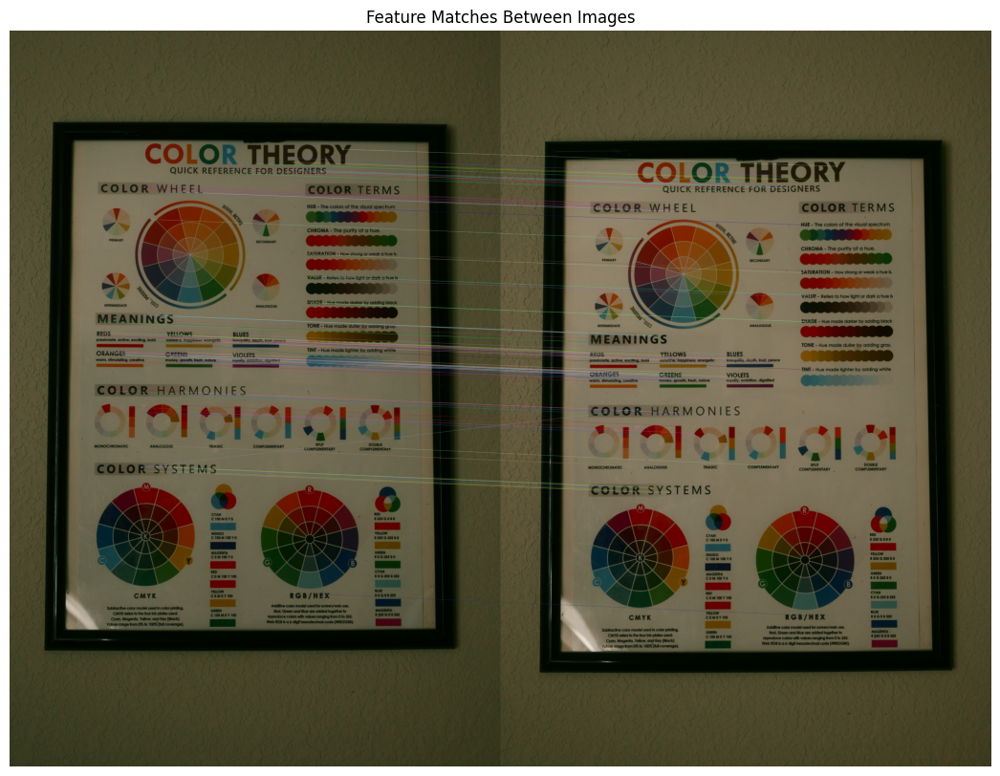

In [4]:
# Load the previously uploaded images
img1_path = "../input/DSC_8783.JPG"
img2_path = "../input/DSC_8784.JPG"

# Load and convert to RGB
img1_rgb = cv2.cvtColor(cv2.imread(img1_path), cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(cv2.imread(img2_path), cv2.COLOR_BGR2RGB)

# img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
# img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

match_vis = visualize_feature_matches(img1_rgb, img2_rgb, scale=0.5, max_matches=100)

plt.figure(figsize=(16, 10))
plt.imshow(match_vis)
plt.title("Feature Matches Between Images")
plt.axis('off')
plt.show()


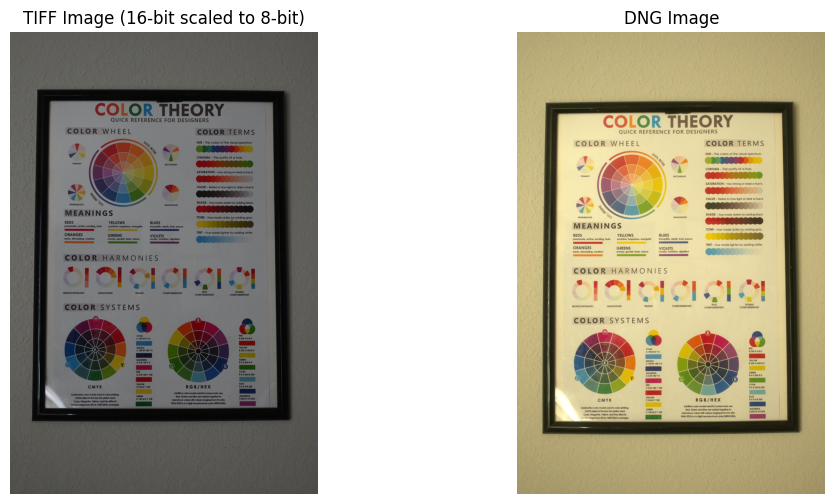

In [5]:
import cv2
import rawpy
import numpy as np
import matplotlib.pyplot as plt

img1_path = "../input/DSC_8783_org.TIF"  # TIFF file (16-bit)
img1_path = "../input/DSC_8783_org_01.TIF"  # TIFF file (16-bit)
img2_path = "../input/DSC_8784.dng"      # DNG file
# img2_path = "input/DSC_8784_org.TIF"  # TIFF file (16-bit)

# Load 16-bit TIFF as np.array (BGR)
img1 = cv2.imread(img1_path, cv2.IMREAD_UNCHANGED)
if img1 is not None:
    # Convert to RGB if needed
    if img1.ndim == 2:
        img1 = cv2.cvtColor(img1, cv2.COLOR_GRAY2RGB)
    elif img1.shape[2] == 4:
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGRA2RGB)
    else:
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    # Normalize 16-bit to 8-bit for display
    img1_disp = (img1 / 256).astype(np.uint8)
else:
    img1_disp = None

# Load DNG as np.array (RGB)
with rawpy.imread(img2_path) as raw:
    img2 = raw.postprocess()


# # Load 16-bit TIFF as np.array (BGR)
# img2 = cv2.imread(img2_path, cv2.IMREAD_UNCHANGED)
# if img2 is not None:
#     # Convert to RGB if needed
#     if img2.ndim == 2:
#         img2 = cv2.cvtColor(img2, cv2.COLOR_GRAY2RGB)
#     elif img2.shape[2] == 4:
#         img2 = cv2.cvtColor(img2, cv2.COLOR_BGRA2RGB)
#     else:
#         img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
#     # Normalize 16-bit to 8-bit for display
#     img2_disp = (img2 / 256).astype(np.uint8)
# else:
#     img2_disp = None

# Show images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("TIFF Image (16-bit scaled to 8-bit)")
if img1_disp is not None:
    plt.imshow(img1_disp)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("DNG Image")
plt.imshow(img2)
plt.axis('off')

plt.show()

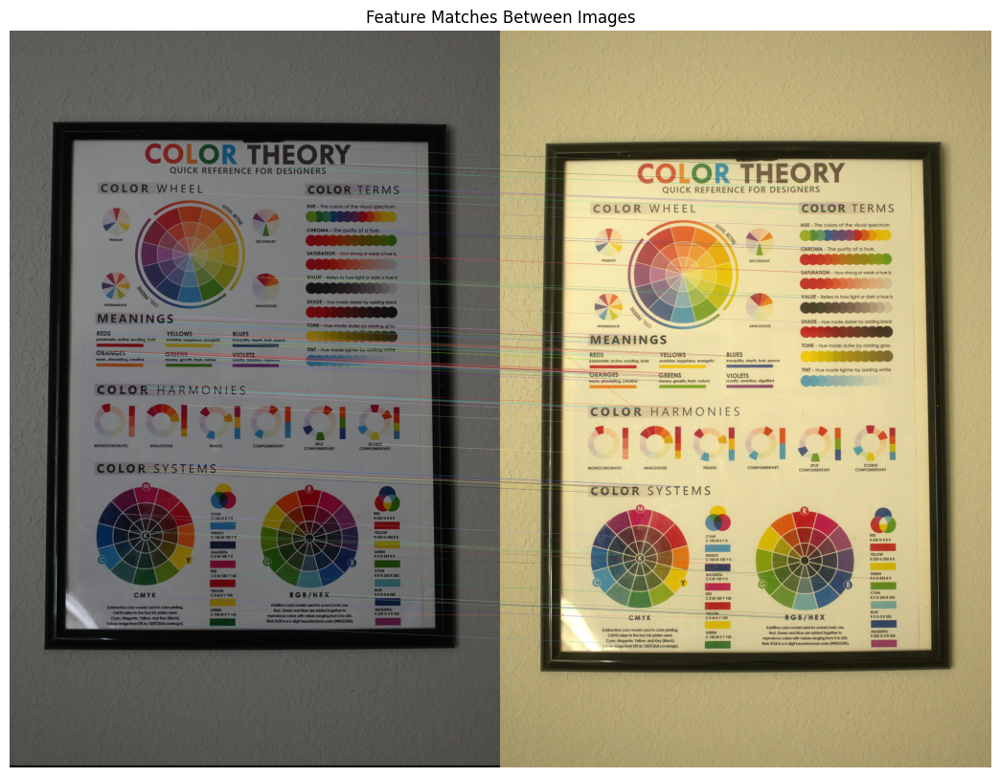

In [6]:
match_vis_tif_dng = visualize_feature_matches(img1_disp, img2, scale=0.5, max_matches=100)

plt.figure(figsize=(16, 10))
plt.imshow(match_vis_tif_dng)
plt.title("Feature Matches Between Images")
plt.axis('off')
plt.show()

In [7]:
img2.shape

(6064, 4040, 3)

In [8]:
img1_disp.shape

(6048, 4032, 3)

In [9]:
# Now crop the images to the same size

In [10]:
def _crop_to_smaller(img1: np.ndarray, img2: np.ndarray) -> (np.ndarray, np.ndarray):
    """
    Crop the larger image to match the dimensions of the smaller image.
    The crop is taken from the top-left corner.

    Args:
        img1 (np.ndarray): First image.
        img2 (np.ndarray): Second image.

    Returns:
        Tuple[np.ndarray, np.ndarray]: Cropped images with the same shape.
    """
    h = min(img1.shape[0], img2.shape[0])
    w = min(img1.shape[1], img2.shape[1])

    img1_cropped = img1[:h, :w]
    img2_cropped = img2[:h, :w]
    return img1_cropped, img2_cropped

In [11]:
import cv2
import numpy as np
from typing import Tuple

def crop_to_shared_region(
    img1: np.ndarray,
    img2: np.ndarray,
    threshold: int = 10,
    assume_rgb_input: bool = True
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Conservatively crops two aligned images to their mutually overlapping non-black region.

    Parameters:
        img1 (np.ndarray): First image (assumed RGB by default).
        img2 (np.ndarray): Second image aligned to img1.
        threshold (int): Pixel intensity threshold to consider a pixel as valid (non-black).
        assume_rgb_input (bool): If True, input is assumed to be RGB (no conversion needed).
                                 If False, input is assumed to be BGR and will be converted to RGB.

    Returns:
        Tuple[np.ndarray, np.ndarray]: Cropped img1 and img2 to the shared content region.
    """
    img1, img2 = _crop_to_smaller(img1, img2)
    assert img1.shape == img2.shape, "Images must have the same shape"

    if not assume_rgb_input:
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    # Compute grayscale masks for non-black regions
    mask1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY) > threshold
    mask2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY) > threshold
    shared_mask = mask1 & mask2

    coords = np.argwhere(shared_mask)
    if coords.size == 0:
        raise ValueError("No shared region found between the two images.")

    y_min, x_min = coords.min(axis=0)
    y_max, x_max = coords.max(axis=0)

    cropped_img1 = img1[y_min:y_max + 1, x_min:x_max + 1]
    cropped_img2 = img2[y_min:y_max + 1, x_min:x_max + 1]

    return cropped_img1, cropped_img2


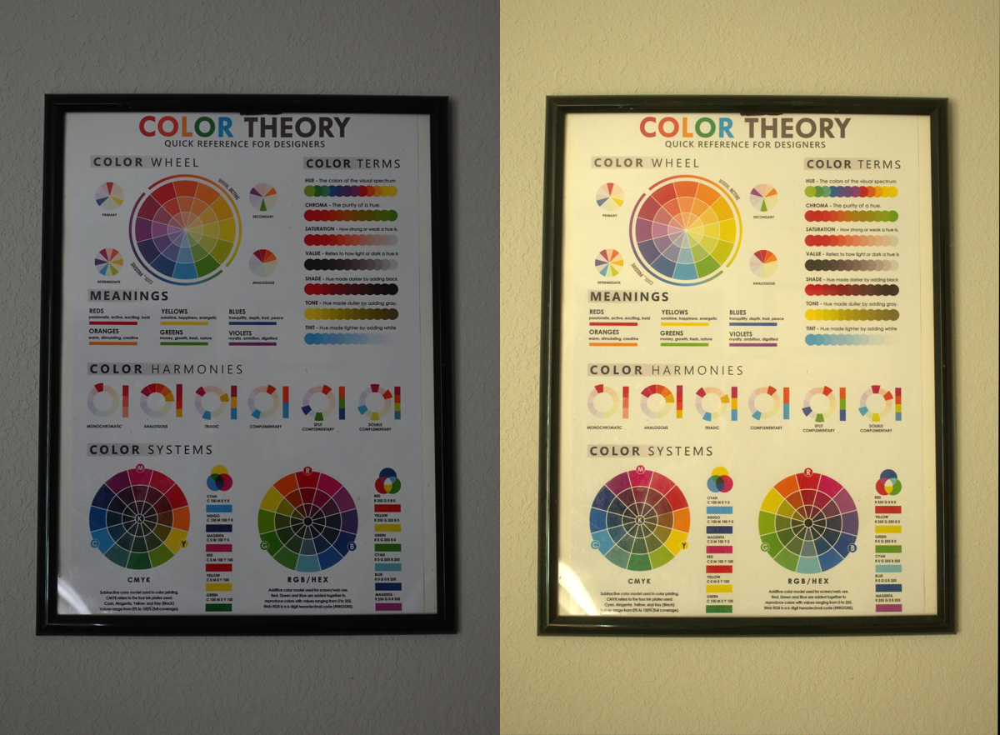

In [12]:
# # Load the previously uploaded images
# img1_path = "input/DSC_8783.JPG"
# img2_path = "input/DSC_8784.JPG"

# # Load and convert to RGB
# img1 = cv2.cvtColor(cv2.imread(img1_path), cv2.COLOR_BGR2RGB)
# img2 = cv2.cvtColor(cv2.imread(img2_path), cv2.COLOR_BGR2RGB)

# # img1 = cv2.imread(img1_path)
# # img2 = cv2.imread(img2_path)

aligned_img1, aligned_img2 = align_images_by_features(img1_disp, img2)
cropped1, cropped2 = crop_to_shared_region(aligned_img1, aligned_img2)

# preview_and_compare_img(img1_disp, img2)
preview_images([cropped1, cropped2])

In [13]:
print(f"{aligned_img1.shape=}")
print(f"{cropped1.shape=}")

aligned_img1.shape=(6048, 4032, 3)
cropped1.shape=(5890, 4003, 3)


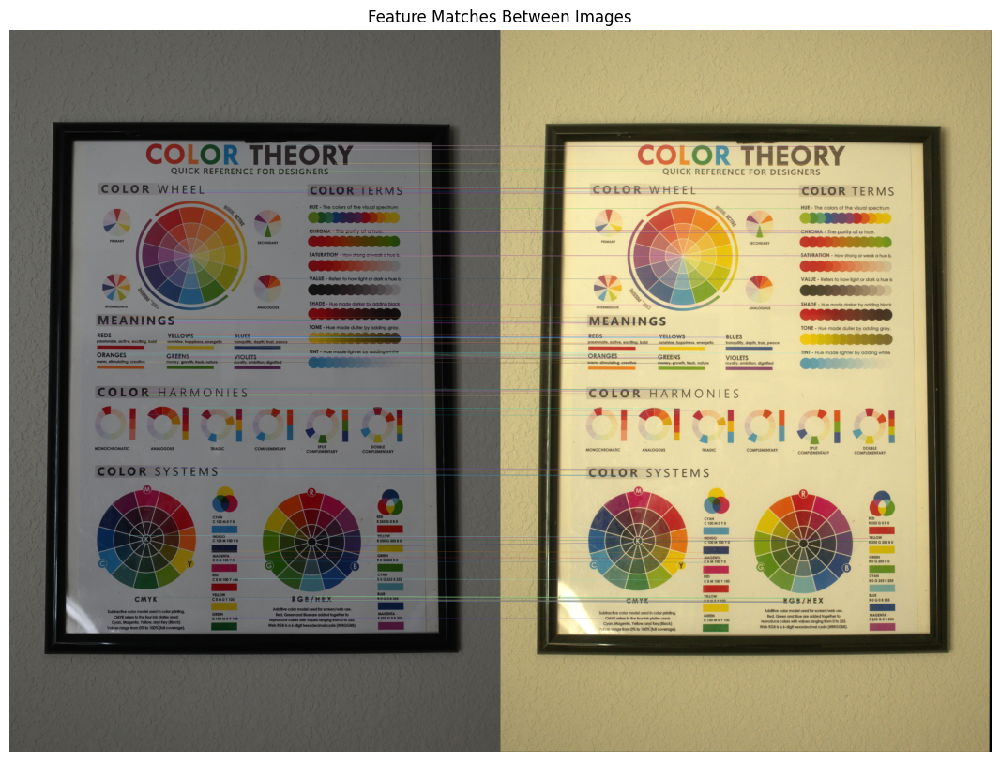

In [14]:
match_vis_cropped = visualize_feature_matches(cropped1, cropped2, scale=0.5, max_matches=100)

plt.figure(figsize=(16, 10))
plt.imshow(match_vis_cropped)
plt.title("Feature Matches Between Images")
plt.axis('off')
plt.show()

In [15]:
cropped1.shape

(5890, 4003, 3)

In [16]:
cropped2.shape

(5890, 4003, 3)

In [17]:
img1_disp.shape

(6048, 4032, 3)

In [18]:
# cropped1.save("cropped1.png")
# cropped2.save("cropped1.png")

# preview_images(cv2.cvtColor(cropped1, cv2.COLOR_BGR2RGB)).save("../output/cropped1.jpg")
# preview_images(cv2.cvtColor(cropped2, cv2.COLOR_BGR2RGB)).save("../output/cropped2.jpg")

preview_images(cropped1).save("../output/cropped1.jpg")
preview_images(cropped2).save("../output/cropped2.jpg")

In [19]:
# color cluster mapping

## Color Cluster Mapping

This section implements **color cluster mapping** as part of the film emulation workflow.  
Color cluster mapping is used to match the color distributions between two aligned images (e.g., a digital reference and a scanned film image) by grouping pixels into clusters in color space and mapping these clusters from one image to another.

### Purpose

- To reduce color differences between the source and target images after geometric alignment.
- To enable more robust color transfer by working with groups of similar colors rather than individual pixels.

### Method Overview

1. **Color Clustering:**  
   - Both images are converted to a suitable color space (e.g., Lab or RGB).
   - K-means or another clustering algorithm is used to segment each image into a set number of color clusters.

2. **Cluster Matching:**  
   - Clusters from the source image are matched to clusters in the target image, typically by comparing cluster centroids.

3. **Color Mapping:**  
   - The color of each pixel in the source image is adjusted to match the corresponding target cluster, resulting in a new image with a color distribution closer to the target.

### Applications

- Film emulation and digital-to-film look transfer.
- Color grading and style transfer between images.
- Preprocessing for further color correction or tone mapping.

---

**Inputs:**  
- Two geometrically aligned images (source and target).

**Outputs:**  
- A color-mapped image where the source image’s colors are transformed to match the target’s color clusters.

For more details on the overall workflow, refer to the project

In [20]:
# Re-import dependencies after reset
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
import skimage.color
from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.feature import peak_local_max

In [21]:
def classify_color_from_rgb(rgb) -> tuple[str, str]:
    """
    Classify a given RGB color into a named color category using HSV rules.

    Parameters:
        rgb (array-like): RGB color triplet.

    Returns:
        str: Name of the color (e.g., "red", "green", "gray", etc.)
    """
    # Convert RGB to HSV using OpenCV.
    # Note: OpenCV uses the following ranges:
    #   - Hue (h): 0 to 179  (represents 0° to 360°)
    #   - Saturation (s): 0 to 255
    #   - Value (v): 0 to 255
    rgb_np = np.array([[rgb]], dtype=np.uint8)
    hsv = cv2.cvtColor(rgb_np, cv2.COLOR_RGB2HSV)[0, 0]
    h, s, v = hsv

    tone = None
    color = None

    # Handle achromatic cases first
    if v < 40:
        tone = "shadow"
    elif v > 200:
        tone = "highlight"
    else:
        tone = "mid"

    # Use hue to determine chromatic color
    if h < 10 or h >= 170:
        color = "red"
    elif 10 <= h < 25:
        color =  "orange"
    elif 25 <= h < 35:
        color =  "yellow"
    elif 35 <= h < 85:
        color =  "green"
    elif 85 <= h < 100:
        color =  "cyan"
    elif 100 <= h < 140:
        color =  "blue"
    elif 140 <= h < 160:
        color =  "purple"
    elif 160 <= h < 170:
        color =  "magenta"
    else:
        color =  "other"
    
    return (tone, color)


In [22]:
def detect_color_clusters_from_rgb_image(
    rgb_image: np.ndarray,
    num_clusters: int = 12,
    min_area: int = 200,
    factor_neighbour: float = 0.6,
    factor_downsampling: float = 1.0
) -> list[dict]:
    """
    Perform perceptual color clustering on an RGB image using LAB space and refine using watershed segmentation.

    Parameters:
        rgb_image (np.ndarray): Input image in RGB format.
        num_clusters (int): Number of initial color clusters (via KMeans).
        min_area (int): Minimum area (in pixels) for a detected region to be considered valid.
        factor_neighbour (float): Watershed compactness parameter controlling the greediness of region expansion.
                                  Smaller values (e.g., 0.4–0.6) allow more merging of nearby regions.
        factor_downsampling (float): Scale factor for downsampling (relative to base 512). Range [0.25, 1.0] recommended.

    Returns:
        list of dict: Each dictionary contains:
            - 'label': Original cluster index.
            - 'mask': Boolean mask for the refined region (resized image shape).
            - 'centroid': (row, col) position of the region centroid (in downscaled space).
            - 'avg_color_rgb': Average RGB value for the region.
            - 'color_name': Color label string (e.g., "green", "red").
            - 'tone': Tone label string (e.g., "shadow", "mid", "high").
            - 'area': Pixel area of the region.
    """
    base_size = int(512 * factor_downsampling)
    rgb_small = cv2.resize(rgb_image, (base_size, base_size))

    lab_small = skimage.color.rgb2lab(rgb_small)
    h, w, _ = lab_small.shape
    pixels_lab = lab_small.reshape((-1, 3))

    kmeans = KMeans(n_clusters=num_clusters, random_state=42).fit(pixels_lab)
    labels = kmeans.labels_.reshape((h, w))

    clusters_info = []

    for cluster_id in range(num_clusters):
        binary_mask = (labels == cluster_id).astype(np.uint8)
        distance = ndi.distance_transform_edt(binary_mask)
        coords = peak_local_max(distance, labels=binary_mask, footprint=np.ones((3, 3)))
        local_maxi = np.zeros_like(distance, dtype=bool)
        local_maxi[tuple(coords.T)] = True
        markers = label(local_maxi)

        ws_labels = watershed(-distance, markers, mask=binary_mask, compactness=factor_neighbour)

        for region in regionprops(ws_labels):
            if region.area < min_area:
                continue

            region_mask = (ws_labels == region.label)
            centroid = region.centroid
            avg_rgb_color = np.mean(rgb_small[region_mask], axis=0)
            tone, color_name = classify_color_from_rgb(avg_rgb_color)

            clusters_info.append({
                'label': cluster_id,
                'mask': region_mask,
                'centroid': centroid,
                'avg_color_rgb': avg_rgb_color,
                'color_name': color_name,
                'tone': tone,
                'area': region.area
            })

    return clusters_info


In [23]:
import cv2
import numpy as np

def visualize_color_clusters_on_rgb_image(
    rgb_image: np.ndarray,
    clusters: list,
    scale_background: float = 0.5,
    draw_labels: bool = True
) -> np.ndarray:
    """
    Render visual annotations of detected color clusters on top of the original image.

    Features:
    - Semi-transparent white mask for each cluster
    - Dot (BGR) at centroid to reflect average color
    - Optional text labels (compact)

    Parameters:
        rgb_image (np.ndarray): Original input image.
        clusters (list): Output from detect_color_clusters_from_rgb_image().
        scale_background (float): Scale factor to downsize visualization background. Range [0.1, 1.0].
        draw_labels (bool): If False, skip drawing text labels to improve speed.

    Returns:
        np.ndarray: Annotated overlay image.
    """
    if not (0.1 <= scale_background <= 1.0):
        raise ValueError("scale_background must be in range [0.1, 1.0]")

    new_h, new_w = int(rgb_image.shape[0] * scale_background), int(rgb_image.shape[1] * scale_background)
    vis_rgb = cv2.resize(rgb_image, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
    overlay = vis_rgb.copy()

    for cluster in clusters:
        mask_h, mask_w = cluster['mask'].shape
        scale_y = new_h / mask_h
        scale_x = new_w / mask_w

        y_f, x_f = cluster['centroid']
        px = int(round(x_f * scale_x))
        py = int(round(y_f * scale_y))

        avg_color_rgb = np.clip(cluster['avg_color_rgb'], 0, 255).astype(int)
        avg_color_bgr = tuple(int(c) for c in avg_color_rgb[::-1])

        index = cluster['label']
        color_name_tone = f"{cluster['color_name']}-{cluster['tone']}"
        rgb_text = f"RGB({avg_color_rgb[0]},{avg_color_rgb[1]},{avg_color_rgb[2]})"

        # Resize and apply mask
        mask_small = cluster['mask'].astype(np.uint8) * 255
        mask_resized = cv2.resize(mask_small, (new_w, new_h), interpolation=cv2.INTER_NEAREST)
        mask_binary = (mask_resized > 0).astype(np.uint8)

        try:
            mask_indices = mask_binary == 1
            overlay[mask_indices] = cv2.addWeighted(
                vis_rgb[mask_indices], 0.7, np.full_like(vis_rgb[mask_indices], 255), 0.3, 0
            )
        except Exception as e:
            print(f"Skipping cluster {index} due to blending error: {e}")
            continue

        radius = max(2, int(min(new_h, new_w) * 0.01))
        # cv2.circle(overlay, (px, py), radius, avg_color_bgr, -1)

        

        if draw_labels:
            scale_base = min(new_h, new_w) / 512

            def scaled_text(scale, min_thickness=1):
                font_scale = round(scale_base * scale * 0.5, 2)  # halve the font size
                thickness = max(min_thickness, int(font_scale * 1.5))  # halve thickness
                return font_scale, thickness

            # Track already drawn indices
            if "drawn_indices" not in globals():
                global drawn_indices
                drawn_indices = set()

            font_scale, thickness = scaled_text(0.25)

            if index not in drawn_indices:
                label_text = f"{index} {color_name_tone} {rgb_text}"
                drawn_indices.add(index)
            else:
                label_text = f"{index}"

            # Draw "+" marker at center
            cv2.putText(overlay, "+", (px, py),
                        cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), thickness)

            # Draw label text next to the dot
            cv2.putText(overlay, label_text, (px + radius + 4, py),
                        cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), thickness)

    return overlay


In [24]:
clusters = detect_color_clusters_from_rgb_image(cropped1, num_clusters=30, min_area=20, factor_downsampling=1.5)
print(len(clusters))
clusters[0]

6255


{'label': 0,
 'mask': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]], shape=(768, 768)),
 'centroid': (np.float64(119.5), np.float64(229.0)),
 'avg_color_rgb': array([125.15384615, 124.07692308, 126.23076923]),
 'color_name': 'blue',
 'tone': 'mid',
 'area': np.float64(26.0)}

In [25]:
# simiplied version
clusters = detect_color_clusters_from_rgb_image(cropped1, num_clusters=30, min_area=20)
print(len(clusters))
clusters[0]

2762


{'label': 0,
 'mask': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]], shape=(512, 512)),
 'centroid': (np.float64(79.06060606060606), np.float64(88.12121212121212)),
 'avg_color_rgb': array([112.6969697 , 113.33333333, 115.75757576]),
 'color_name': 'blue',
 'tone': 'mid',
 'area': np.float64(33.0)}

In [26]:
# Re-import required libraries after code execution state reset
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict, Counter
from matplotlib.patches import Patch

# Define the function again after reset
def plot_color_tone_distribution(clusters: list) -> None:
    color_order = ["red", "orange", "yellow", "green", "cyan", "blue", "purple", "magenta"]
    tone_order = ["shadow", "mid", "high"]

    tone_counts = defaultdict(lambda: defaultdict(int))
    tone_rgb_sums = defaultdict(lambda: defaultdict(lambda: np.zeros(3)))
    category_totals = Counter()
    tone_totals = defaultdict(int)

    for cluster in clusters:
        color = cluster["color_name"]
        tone = cluster.get("tone", "mid")
        tone_counts[color][tone] += 1
        tone_rgb_sums[color][tone] += cluster["avg_color_rgb"]
        category_totals[color] += 1
        tone_totals[tone] += 1

    total_clusters = sum(category_totals.values())

    fig, ax = plt.subplots(figsize=(14, 7))
    bar_width = 0.25
    x = np.arange(len(color_order))

    for i, tone in enumerate(tone_order):
        bar_vals = [tone_counts[color].get(tone, 0) for color in color_order]
        bars = ax.bar(x + i * bar_width, bar_vals, width=bar_width, label=f"{tone.capitalize()} Tone")

        for j, bar in enumerate(bars):
            color = color_order[j]
            count = tone_counts[color].get(tone, 0)
            if count > 0:
                avg_rgb = tone_rgb_sums[color][tone] / count
                avg_rgb_clipped = np.clip(avg_rgb, 0, 255).astype(int)
                bar.set_color(np.array(avg_rgb_clipped) / 255.0)
                ax.text(
                    bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                    f"{tone} ({count})\nRGB({avg_rgb_clipped[0]},{avg_rgb_clipped[1]},{avg_rgb_clipped[2]})",
                    ha='center', fontsize=8, rotation=90
                )

    xtick_labels = [f"{color}\n({category_totals[color]})" for color in color_order]
    tone_labels = {"shadow": "Shadow Tone", "mid": "Mid Tone", "high": "High Tone"}
    tone_colors = {"shadow": "#2f0f0f", "mid": "#801515", "high": "#2cb62c"}
    legend_handles = [
        Patch(color=tone_colors[tone], label=f"{tone_labels[tone]} ({tone_totals[tone]})")
        for tone in tone_order
    ]

    ax.set_xlabel("Color Category (Total Clusters)")
    ax.set_ylabel("Number of Clusters")
    ax.set_title(f"Cluster Tone Counts by Color Category (Total = {total_clusters})")
    ax.set_xticks(x + bar_width)
    ax.set_xticklabels(xtick_labels, rotation=0)
    ax.legend(handles=legend_handles, title="Tone Category")
    ax.grid(axis='y')
    plt.tight_layout()
    plt.show()


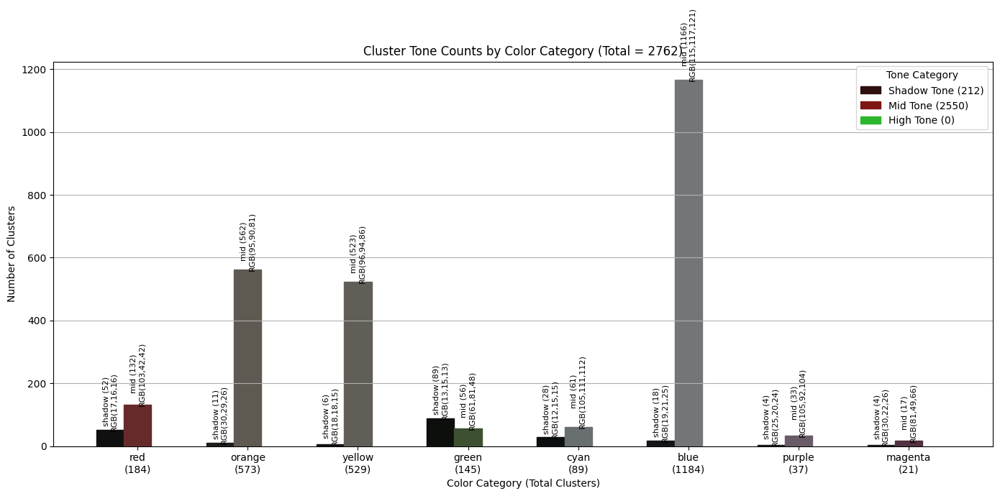

In [27]:
plot_color_tone_distribution(clusters)

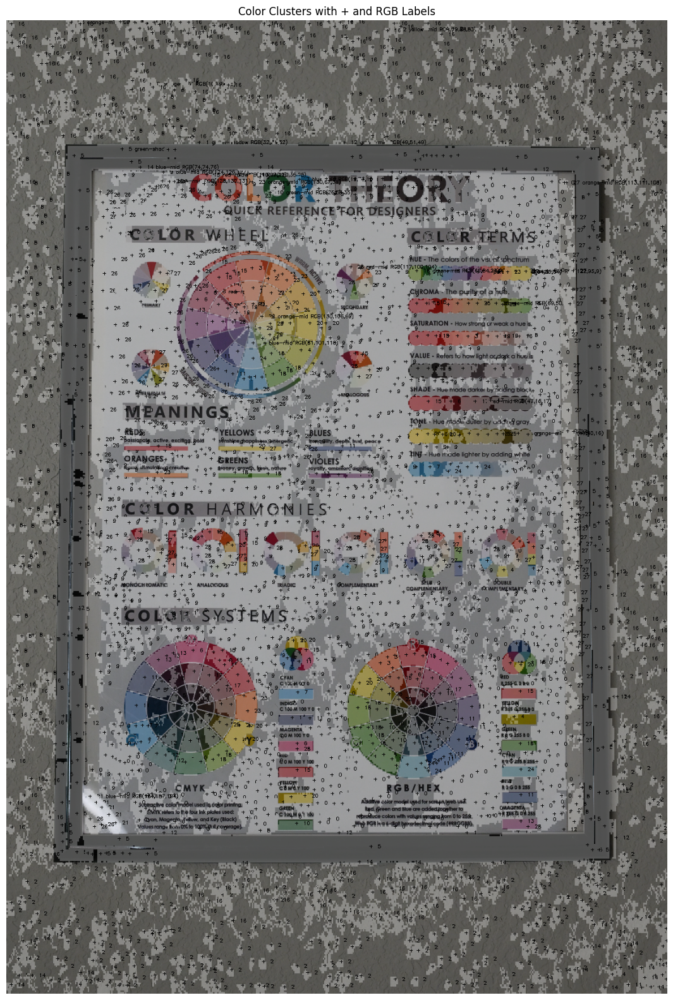

In [28]:
clusters_ref = detect_color_clusters_from_rgb_image(cropped1, num_clusters=30, min_area=20)
# cluster_color = [cluster for cluster in clusters if cluster["color_name"] not in ["black", "orange", "yellow", "green"]]
# cluster_color = [cluster for cluster in clusters if cluster["tone"] in ["mid"]]
# cluster_test["mask"] = np.full((256, 256), True, dtype=bool)

vis_overlay = visualize_color_clusters_on_rgb_image(cropped1, clusters, scale_background=0.3, draw_labels=True)

plt.figure(figsize=(20, 20))
plt.imshow(vis_overlay)
plt.title("Color Clusters with + and RGB Labels")
plt.axis("off")
plt.show()

In [29]:
import numpy as np
import cv2
from skimage.transform import resize as sk_resize

def update_cluster_color_info_with_new_image(
    new_rgb_image: np.ndarray,
    clusters: list,
    renamed: bool = True
) -> list:
    """
    Update avg_color_rgb, tone, and color_name of each cluster using a resized version of the new image
    that matches the cluster mask dimensions.

    Parameters:
        new_rgb_image (np.ndarray): New RGB image (H_orig x W_orig x 3).
        clusters (list): List of cluster dictionaries with 'mask' of shape (H_mask x W_mask).
        renamed (bool): If True, updated keys will have *_updated suffix. If False, overwrite original fields.

    Returns:
        list: Updated cluster list.
    """
    if not clusters:
        return []

    mask_shape = clusters[0]['mask'].shape
    target_h, target_w = mask_shape

    # Resize once
    resized_image = cv2.resize(new_rgb_image, (target_w, target_h), interpolation=cv2.INTER_LINEAR)

    updated_clusters = []

    for cluster in clusters:
        mask = cluster['mask']
        region_pixels = resized_image[mask]

        if region_pixels.size == 0:
            avg_rgb = np.array([0, 0, 0])
            tone, color = "unknown", "unknown"
        else:
            avg_rgb = np.mean(region_pixels, axis=0)
            tone, color = classify_color_from_rgb(avg_rgb)

        cluster_updated = cluster.copy()

        if renamed:
            cluster_updated['avg_color_rgb_updated'] = avg_rgb
            cluster_updated['color_name_updated'] = color
            cluster_updated['tone_updated'] = tone
        else:
            cluster_updated['avg_color_rgb'] = avg_rgb
            cluster_updated['color_name'] = color
            cluster_updated['tone'] = tone

        updated_clusters.append(cluster_updated)

    return updated_clusters



In [30]:
# bgr_img2_aligned = cv2.cvtColor(cropped2, cv2.COLOR_RGB2BGR)
bgr_img2_aligned = cropped2
clusters_updated = update_cluster_color_info_with_new_image(bgr_img2_aligned, clusters)
clusters_updated[0]

{'label': 0,
 'mask': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]], shape=(512, 512)),
 'centroid': (np.float64(79.06060606060606), np.float64(88.12121212121212)),
 'avg_color_rgb': array([112.6969697 , 113.33333333, 115.75757576]),
 'color_name': 'blue',
 'tone': 'mid',
 'area': np.float64(33.0),
 'avg_color_rgb_updated': array([170.39393939, 160.15151515, 121.81818182]),
 'color_name_updated': 'orange',
 'tone_updated': 'mid'}

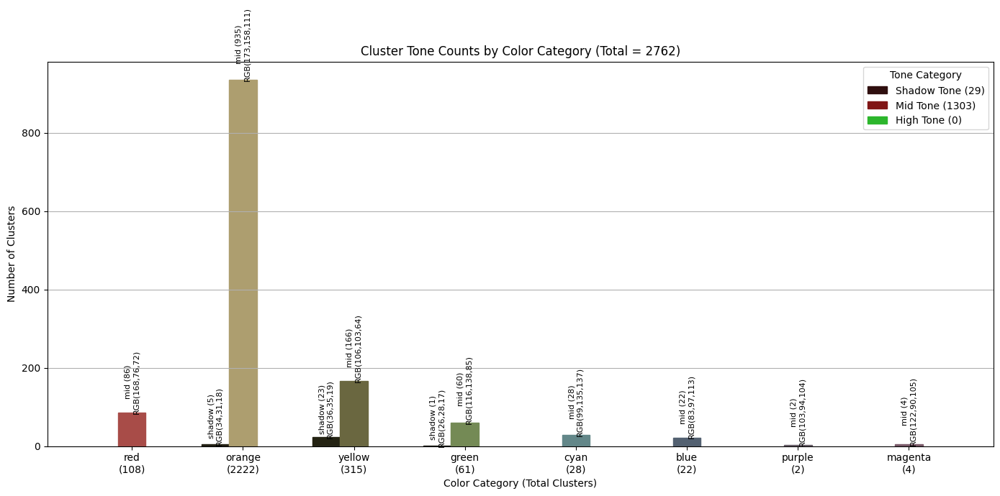

In [35]:
plot_color_tone_distribution(clusters_updated)

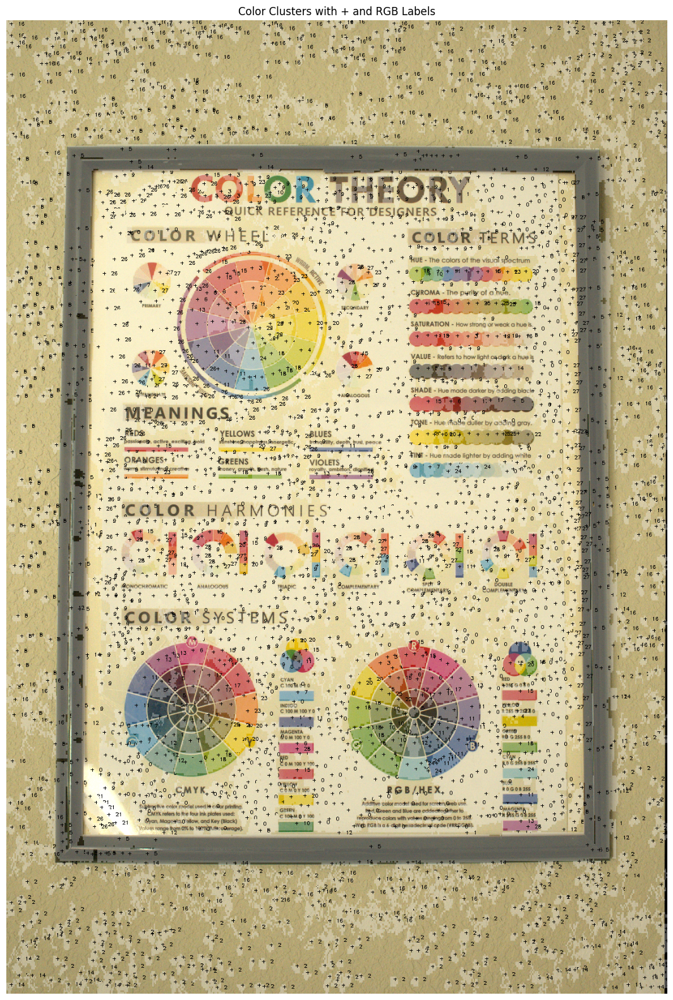

In [32]:
clusters_updated = update_cluster_color_info_with_new_image(bgr_img2_aligned, clusters_ref, renamed=False)
# cluster_color = [cluster for cluster in clusters if cluster["color_name"] not in ["black", "orange", "yellow", "green"]]
# cluster_color = [cluster for cluster in clusters if cluster["tone"] in ["mid"]]
# cluster_test["mask"] = np.full((256, 256), True, dtype=bool)

vis_overlay = visualize_color_clusters_on_rgb_image(bgr_img2_aligned, clusters_updated, scale_background=0.3, draw_labels=True)

plt.figure(figsize=(20, 20))
plt.imshow(vis_overlay)
plt.title("Color Clusters with + and RGB Labels")
plt.axis("off")
plt.show()

In [33]:
clusters[0]

{'label': 0,
 'mask': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]], shape=(512, 512)),
 'centroid': (np.float64(79.06060606060606), np.float64(88.12121212121212)),
 'avg_color_rgb': array([112.6969697 , 113.33333333, 115.75757576]),
 'color_name': 'blue',
 'tone': 'mid',
 'area': np.float64(33.0)}

In [34]:
clusters_updated[0]

{'label': 0,
 'mask': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]], shape=(512, 512)),
 'centroid': (np.float64(79.06060606060606), np.float64(88.12121212121212)),
 'avg_color_rgb': array([170.39393939, 160.15151515, 121.81818182]),
 'color_name': 'orange',
 'tone': 'mid',
 'area': np.float64(33.0)}